# Stats on the dataset

In [1]:
import re
import os

normal_cases = set()
baterial_cases = set()
viral_cases = set()

types = ['test', 'train','val']
pattern_virus = re.compile('.*virus.*')
pattern_bacteria = re.compile('.*bacteria.*')
pattern_normal = re.compile('.*NORMAL.*')


for type_desc in types:
    data_path_normal = f"ml4h_data/p2/part2/archive/chest_xray/{type_desc}/NORMAL/"
    data_path_infected = f"ml4h_data/p2/part2/archive/chest_xray/{type_desc}/PNEUMONIA/"

    for filename in os.listdir(data_path_normal):
      normal_cases.add((data_path_normal,filename))

    for filename in os.listdir(data_path_infected):
      if pattern_bacteria.match(filename):
        baterial_cases.add((data_path_infected,filename))
      if pattern_virus.match(filename):
        viral_cases.add((data_path_infected,filename))


print(f'Normal cases: {len(normal_cases)}')
print(f'Baterial cases: {len(baterial_cases)}')
print(f'Viral cases: {len(viral_cases)}')

Normal cases: 1583
Baterial cases: 2780
Viral cases: 1493


In [ ]:
normal_cases

As we can see here, there are about twice as much samples where the patient had a bacterial case of pneumonia, compared to healthy patients and patients with a viral case of pneumonia.

normal_cases
('ml4h_data/p2/part2/archive/chest_xray/train/NORMAL/', 'IM-0539-0001-0002.jpeg')


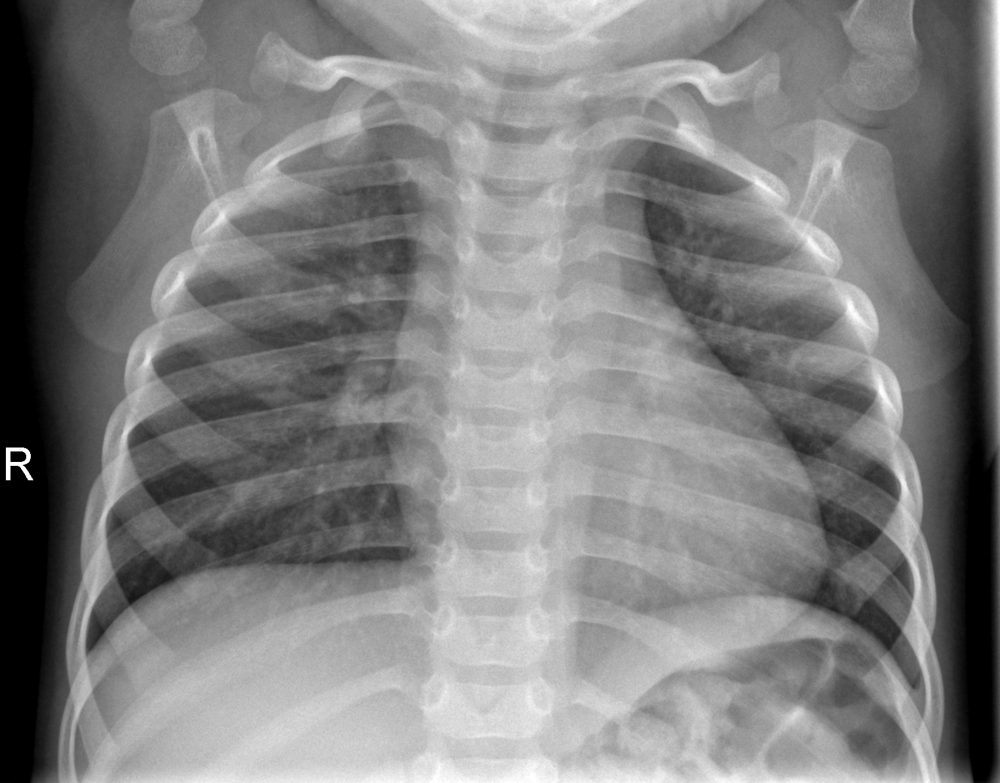

('ml4h_data/p2/part2/archive/chest_xray/train/NORMAL/', 'NORMAL2-IM-1278-0001.jpeg')


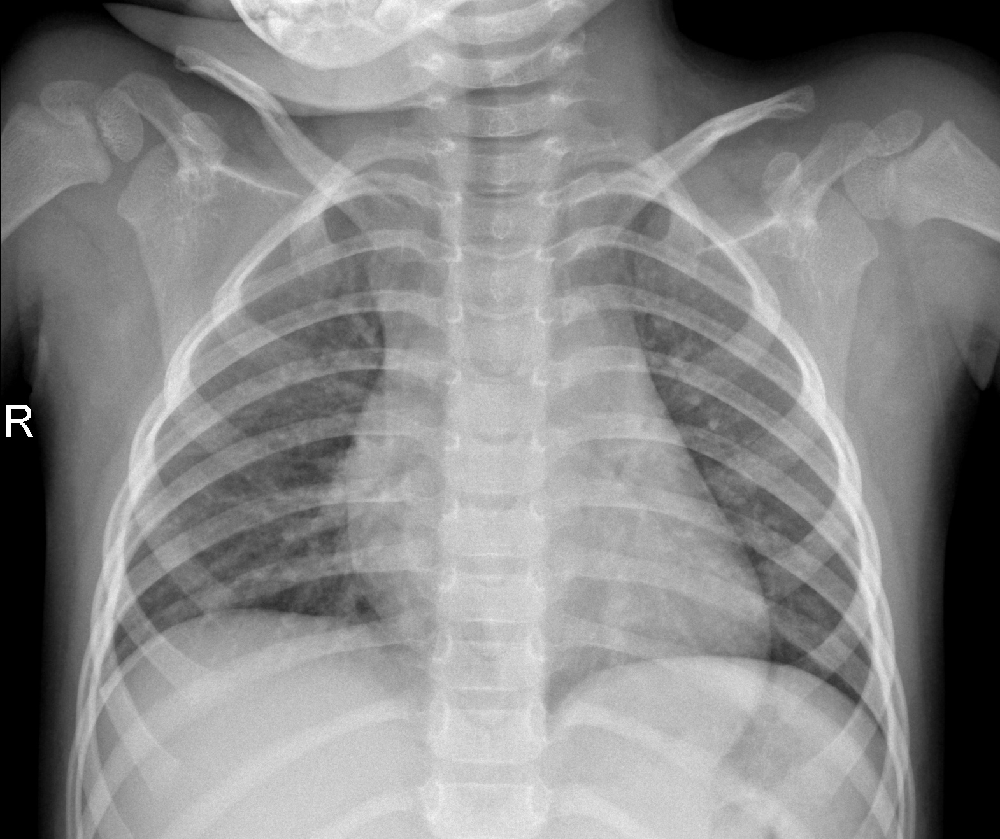

('ml4h_data/p2/part2/archive/chest_xray/train/NORMAL/', 'NORMAL2-IM-1043-0001.jpeg')


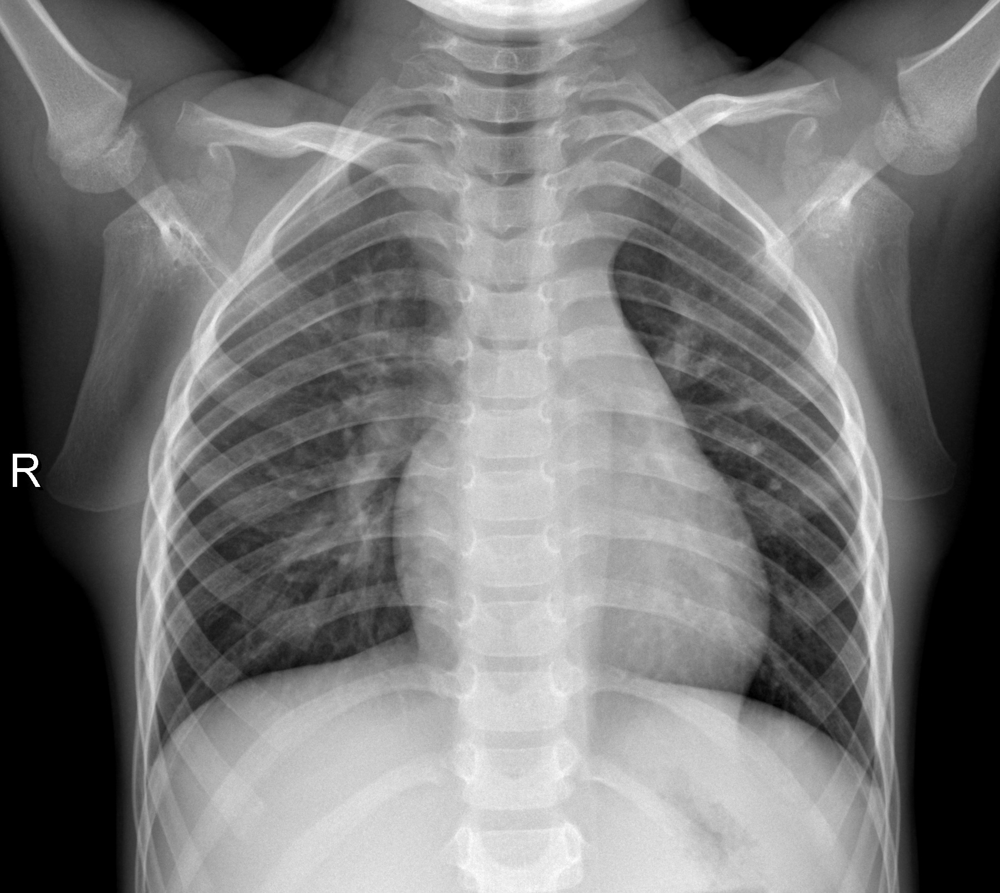




baterial_cases
('ml4h_data/p2/part2/archive/chest_xray/train/PNEUMONIA/', 'person486_bacteria_2054.jpeg')


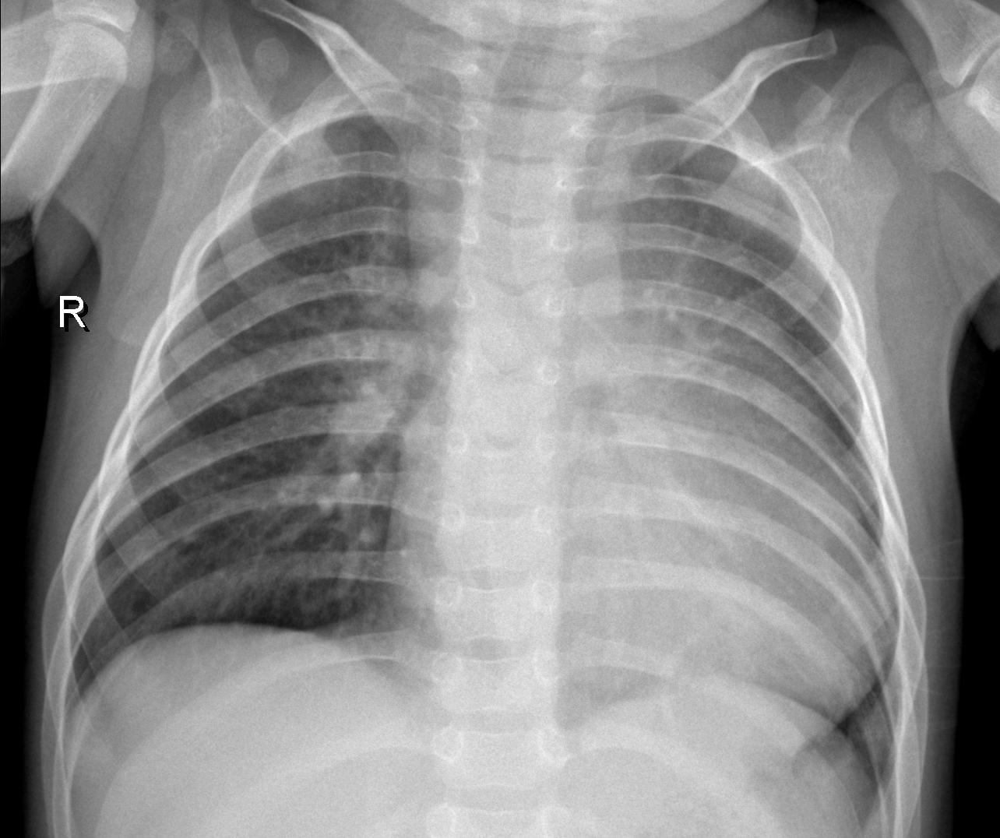

('ml4h_data/p2/part2/archive/chest_xray/train/PNEUMONIA/', 'person842_bacteria_2762.jpeg')


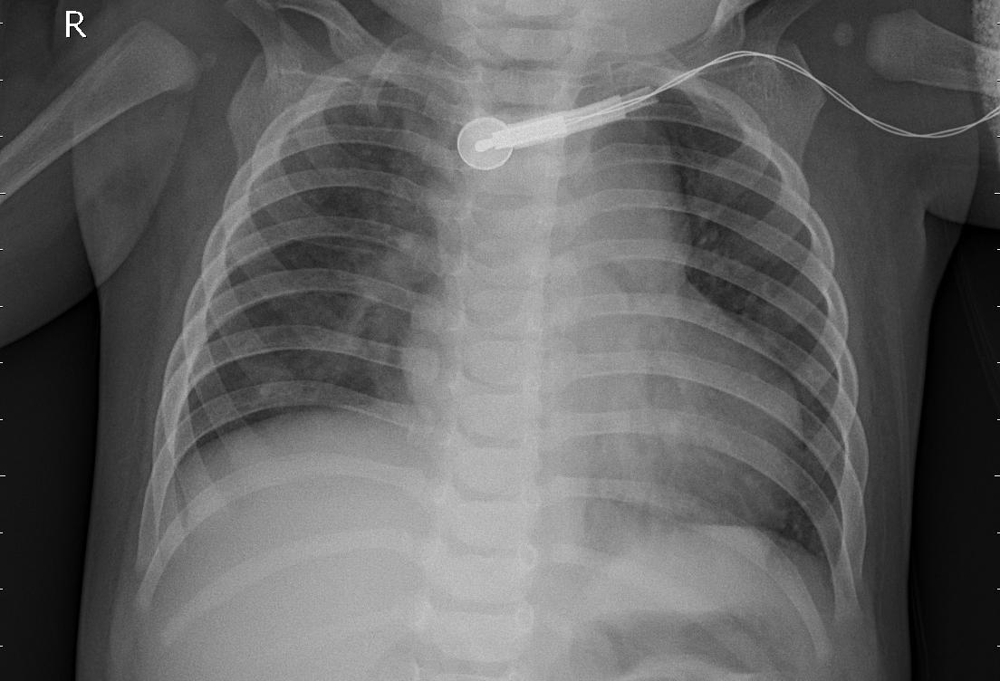

('ml4h_data/p2/part2/archive/chest_xray/train/PNEUMONIA/', 'person371_bacteria_1702.jpeg')


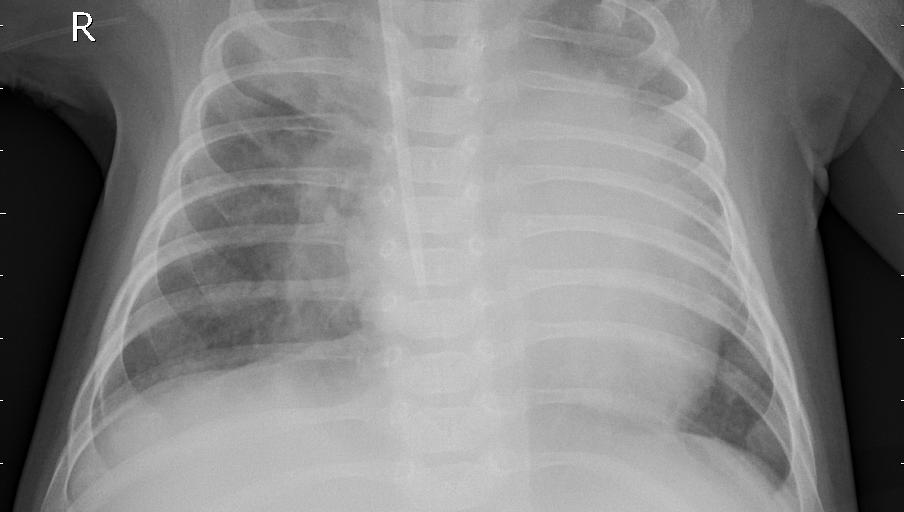




viral_cases
('ml4h_data/p2/part2/archive/chest_xray/test/PNEUMONIA/', 'person1641_virus_2840.jpeg')


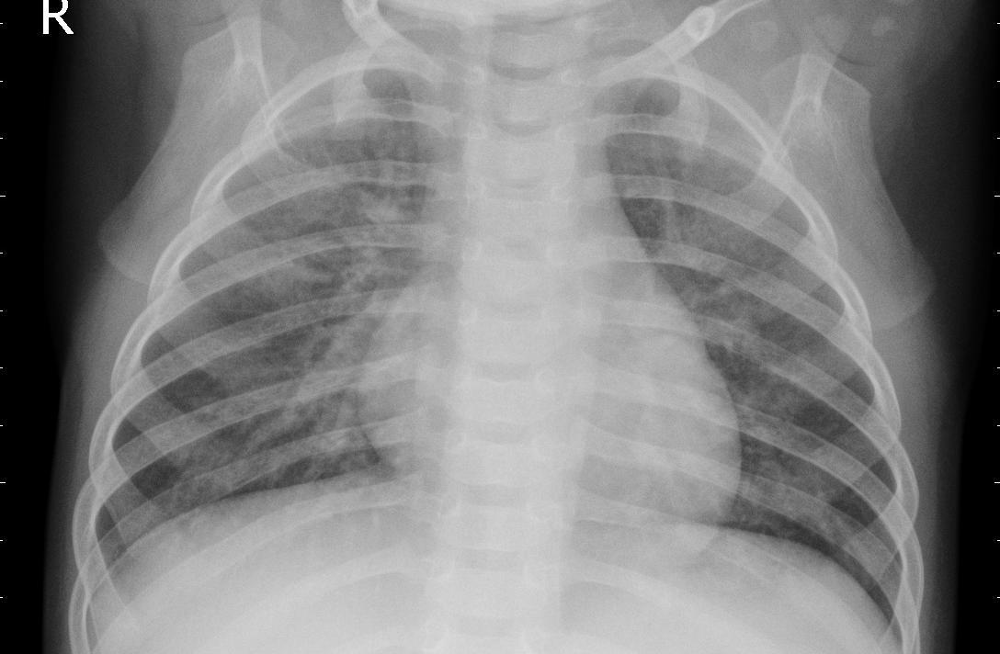

('ml4h_data/p2/part2/archive/chest_xray/train/PNEUMONIA/', 'person776_virus_1405.jpeg')


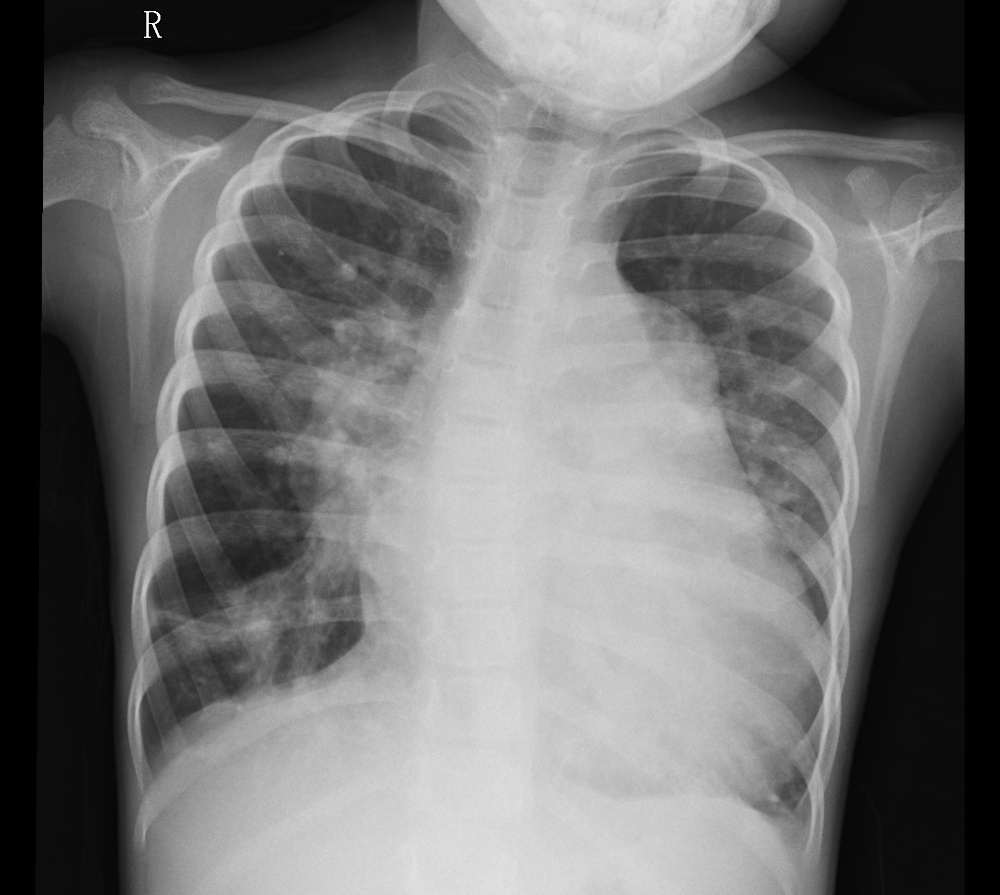

('ml4h_data/p2/part2/archive/chest_xray/train/PNEUMONIA/', 'person1371_virus_2361.jpeg')


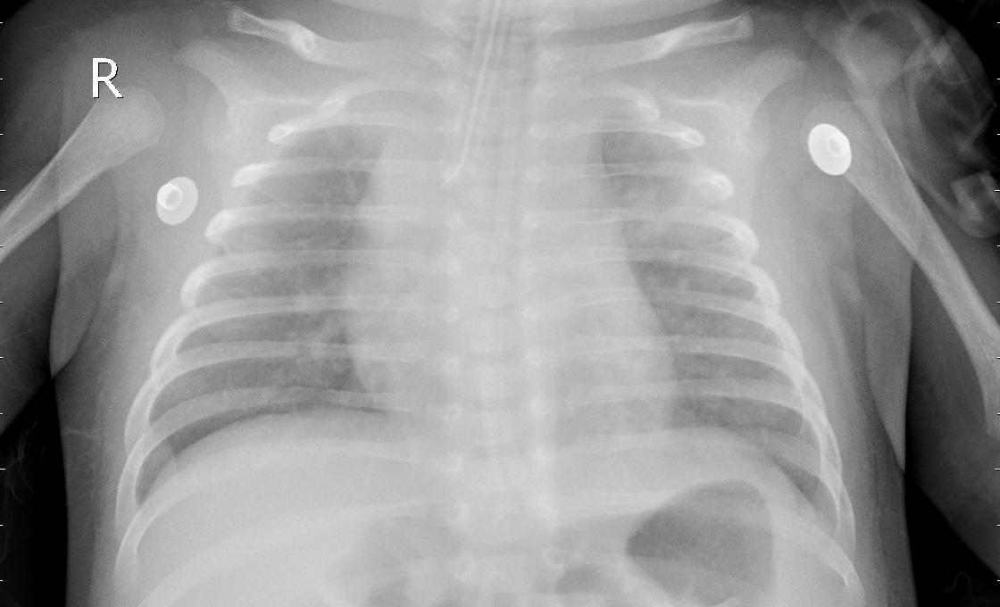

In [4]:
from IPython.display import Image
SEPARATOR = '\n' + ('=' * 100) + '\n\n\n'
IMG_SIZE = 256
STOP_AT = 3 

print('normal_cases')
for i, (path,case) in enumerate(normal_cases):
    print((path,case))
    display(Image(filename=path+case,width=IMG_SIZE))
    if i == STOP_AT-1:
        break

print(f'{SEPARATOR}baterial_cases')
for i, (path,case) in enumerate(baterial_cases):
    print((path,case))
    display(Image(filename=path+case,width=IMG_SIZE))
    if i == STOP_AT-1:
        break

print(f'{SEPARATOR}viral_cases')
for i, (path,case) in enumerate(viral_cases):
    print((path,case))
    display(Image(filename=path+case,width=IMG_SIZE))
    if i == STOP_AT-1:
        break


Looking at the images, it is not always very clear which is which. The healthy patients' X-Ray images seem a bit clearer, and maybe a bit more even, with less lighter spots far away from the spine/heart.

When looking at the dataset, we see that the data is unbalanced, having about the same amount of samples with bacterial pneumonia, as viral pneumonia and healthy samples combined. Ideally there should be about the same amount of each.  Also, some images seem to have some writing on them (eg in `person1599_virus_2775.jpeg`). But since most of the pictures from the sample dont seem to hat it, this shouldnt pose a huge problem.

The images are very big, having around 1800*1200 pixels. This is often too much information to pass into the model. So we will have to downsample the images, and crop them, such that they are all the same proportion.

Further preprocessing of the data will be done by augmenting the dataset. This will give us more points that can be used to train the model, and also decrease the risk of overfitting. For example augmenting the HSV, or croping and resizing the image.

# Pytorch Model

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import torch.backends.cudnn as cudnn
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os
from PIL import Image
from tempfile import TemporaryDirectory
from tqdm import tqdm
import datetime

cudnn.benchmark = True
plt.ion()   # interactive mode

In [2]:
data_transforms = {
    'train': transforms.Compose([
        #transforms.RandomResizedCrop(224),
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'test': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

data_dir = 'ml4h_data/p2/part2/archive/chest_xray'
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'val', 'test']}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=4,
                                             shuffle=True, num_workers=2)
              for x in ['train', 'val', 'test']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val', 'test']}
class_names = image_datasets['train'].classes

device = torch.accelerator.current_accelerator().type if torch.accelerator.is_available() else "cpu"
print(f"Using {device} device")

Using cuda device


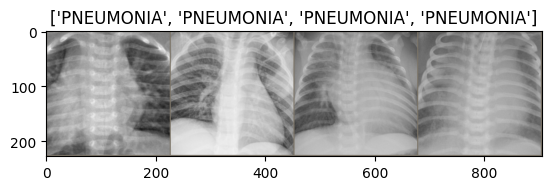

In [3]:
def imshow(inp, title=None):
    """Display image for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated


# Get a batch of training data
inputs, classes = next(iter(dataloaders['train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)

imshow(out, title=[class_names[x] for x in classes])

In [4]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=25, early_stopping=10):
    since = time.time()

    # Create a temporary directory to save training checkpoints
    with TemporaryDirectory() as tempdir:
        best_model_params_path = os.path.join(tempdir, 'best_model_params.pt')

        torch.save(model.state_dict(), best_model_params_path)
        best_acc = 0.0
        best_acc_epoch = 0

        for epoch in tqdm(range(num_epochs)):
            print(f'Epoch {epoch}/{num_epochs - 1}')
            print('-' * 10)

            # Each epoch has a training and validation phase
            for phase in ['train', 'val']:
                if phase == 'train':
                    model.train()  # Set model to training mode
                else:
                    model.eval()   # Set model to evaluate mode

                running_loss = 0.0
                running_corrects = 0

                # Iterate over data.
                for inputs, labels in dataloaders[phase]:
                    inputs = inputs.to(device)
                    labels = labels.to(device)

                    # zero the parameter gradients
                    optimizer.zero_grad()

                    # forward
                    # track history if only in train
                    with torch.set_grad_enabled(phase == 'train'):
                        outputs = model(inputs)
                        _, preds = torch.max(outputs, 1)
                        loss = criterion(outputs, labels)

                        # backward + optimize only if in training phase
                        if phase == 'train':
                            loss.backward()
                            optimizer.step()

                    # statistics
                    running_loss += loss.item() * inputs.size(0)
                    running_corrects += torch.sum(preds == labels.data)
                if phase == 'train':
                    scheduler.step()

                epoch_loss = running_loss / dataset_sizes[phase]
                epoch_acc = running_corrects.double() / dataset_sizes[phase]

                print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

                # deep copy the model
                if phase == 'val' and epoch_acc > best_acc:
                    best_acc = epoch_acc
                    best_acc_epoch = epoch
                    torch.save(model.state_dict(), best_model_params_path)
                elif phase == 'val' and epoch_acc < best_acc and epoch - best_acc_epoch > early_stopping and early_stopping > 0:
                    print(f'Early stopping at epoch {epoch}')
                    time_elapsed = time.time() - since
                    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
                    print(f'Best val Acc: {best_acc:4f}')
            
                    # load best model weights
                    model.load_state_dict(torch.load(best_model_params_path, weights_only=True))
                    return model


            print()

        time_elapsed = time.time() - since
        print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
        print(f'Best val Acc: {best_acc:4f}')

        # load best model weights
        model.load_state_dict(torch.load(best_model_params_path, weights_only=True))
    return model

In [18]:
model_ft = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)
num_ftrs = model_ft.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to ``nn.Linear(num_ftrs, len(class_names))``.
model_ft.fc = nn.Linear(num_ftrs, 2)

model_ft = model_ft.to(device)

criterion = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ft = optim.SGD(model_ft.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

In [19]:
model_ft = train_model(model_ft, criterion, optimizer_ft, exp_lr_scheduler,
                       num_epochs=25) 
now = str(datetime.datetime.now())
torch.save(model_ft, f'chest_xray_resnet_18_ft_{now}.pt')

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch 0/9
----------
train Loss: 0.2071 Acc: 0.9262


 10%|█         | 1/10 [01:05<09:53, 65.97s/it]

val Loss: 0.3201 Acc: 0.8750

Epoch 1/9
----------
train Loss: 0.0976 Acc: 0.9684


 20%|██        | 2/10 [02:10<08:41, 65.25s/it]

val Loss: 0.2815 Acc: 0.7500

Epoch 2/9
----------
train Loss: 0.1200 Acc: 0.9718


 30%|███       | 3/10 [03:15<07:35, 65.13s/it]

val Loss: 0.4400 Acc: 0.6875

Epoch 3/9
----------
train Loss: 0.0819 Acc: 0.9804


 40%|████      | 4/10 [04:20<06:31, 65.19s/it]

val Loss: 0.2480 Acc: 0.9375

Epoch 4/9
----------
train Loss: 0.0626 Acc: 0.9827


 50%|█████     | 5/10 [05:26<05:27, 65.45s/it]

val Loss: 0.3229 Acc: 0.7500

Epoch 5/9
----------
train Loss: 0.0687 Acc: 0.9845


 60%|██████    | 6/10 [06:32<04:22, 65.53s/it]

val Loss: 0.2320 Acc: 0.8750

Epoch 6/9
----------
train Loss: 0.0603 Acc: 0.9843


 70%|███████   | 7/10 [07:37<03:16, 65.42s/it]

val Loss: 0.2527 Acc: 0.8750

Epoch 7/9
----------
train Loss: 0.0491 Acc: 0.9916


 80%|████████  | 8/10 [08:42<02:10, 65.27s/it]

val Loss: 0.3918 Acc: 0.8125

Epoch 8/9
----------
train Loss: 0.0399 Acc: 0.9931


 90%|█████████ | 9/10 [09:47<01:05, 65.15s/it]

val Loss: 0.3707 Acc: 0.8125

Epoch 9/9
----------
train Loss: 0.0327 Acc: 0.9933


100%|██████████| 10/10 [10:52<00:00, 65.29s/it]

val Loss: 0.2721 Acc: 0.8125

Training complete in 10m 53s
Best val Acc: 0.937500


In [ ]:
model = torch.load('chest_xray_resnet_18_ft_2025-05-12 14:55:46.234829.pth', weights_only=False)

In [7]:
model_ft

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

# Captum

In [11]:
import torch
import torch.nn.functional as F
import torchvision.transforms as transforms
import torchvision.models as models

import captum
from captum.attr import IntegratedGradients, Occlusion, LayerGradCam, LayerAttribution
from captum.attr import visualization as viz

import os, sys
import json

import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

In [12]:
#test_img = Image.open('ml4h_data/p2/part2/archive/chest_xray/test/NORMAL/IM-0001-0001.jpeg').convert('RGB')
#test_img_data = np.asarray(test_img)
#plt.imshow(test_img_data)
#plt.show()

transform = transforms.Compose([
 transforms.Resize(224),
 transforms.CenterCrop(224),
 transforms.ToTensor()
])

# standard ImageNet normalization
transform_normalize = transforms.Normalize(
     mean=[0.485, 0.456, 0.406],
     std=[0.229, 0.224, 0.225]
 )

idx_to_labels = {'0':'Normal', '1':'Pneumonia'}

Predicted: Normal ( 0.9938475489616394 ), Label: NORMAL


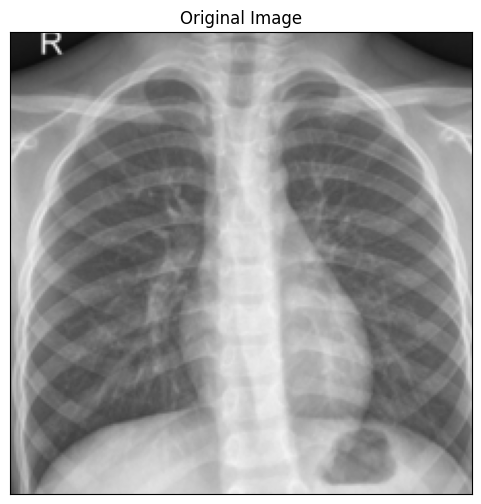

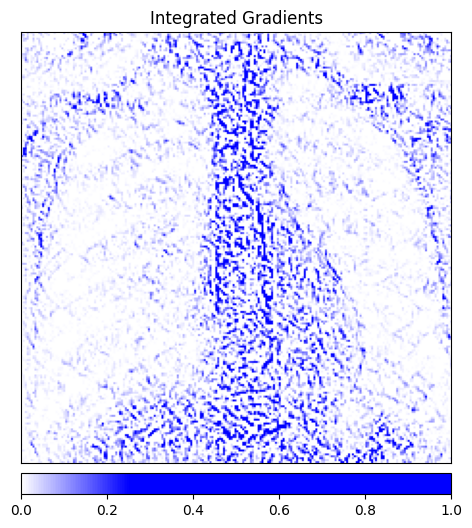

Predicted: Normal ( 0.9879900813102722 ), Label: NORMAL


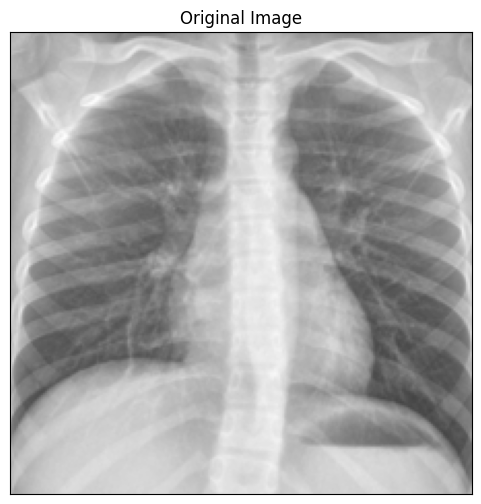

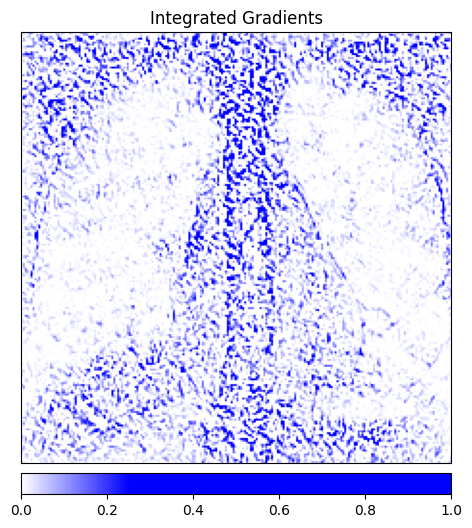

Predicted: Normal ( 0.9852103590965271 ), Label: NORMAL


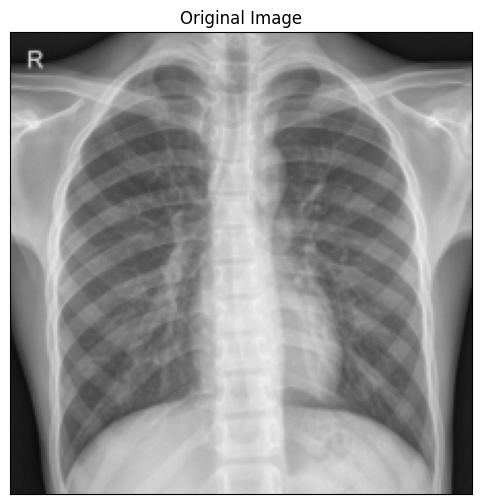

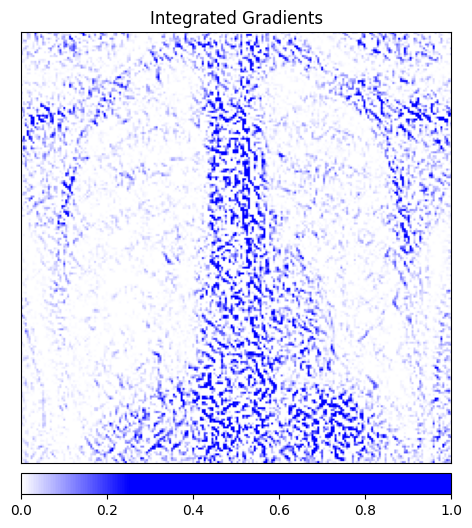

Predicted: Normal ( 0.7919201850891113 ), Label: NORMAL


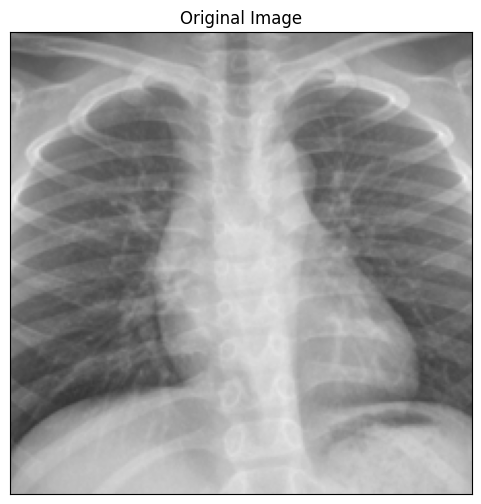

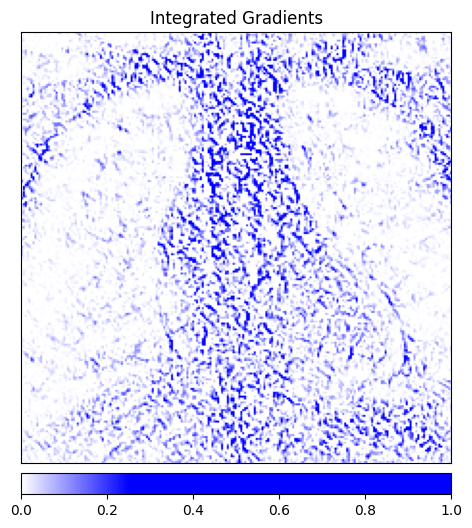

Predicted: Normal ( 0.9709368348121643 ), Label: NORMAL


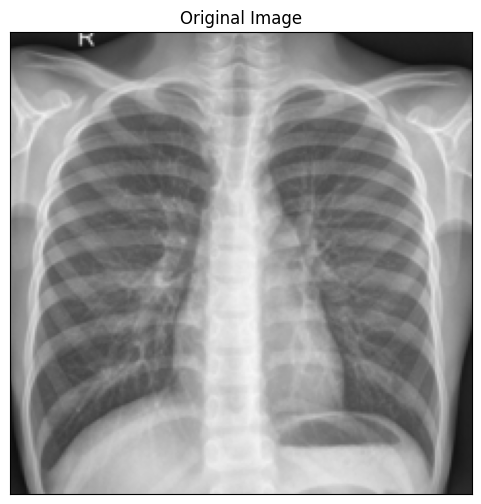

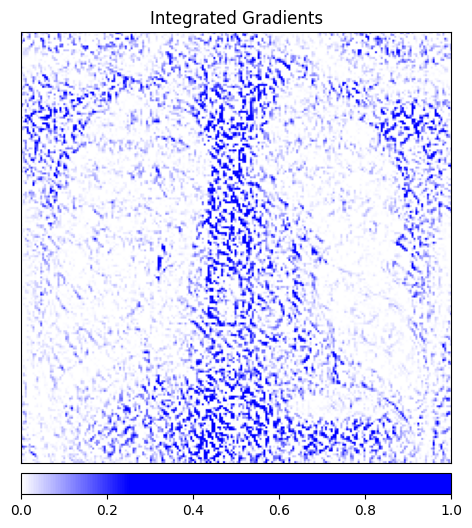

Predicted: Pneumonia ( 0.9873391389846802 ), Label: PNEUMONIA


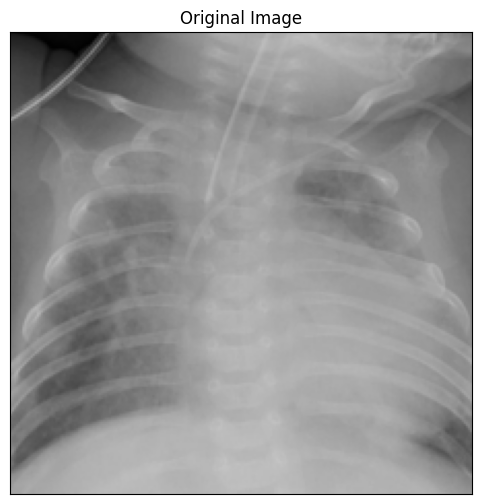

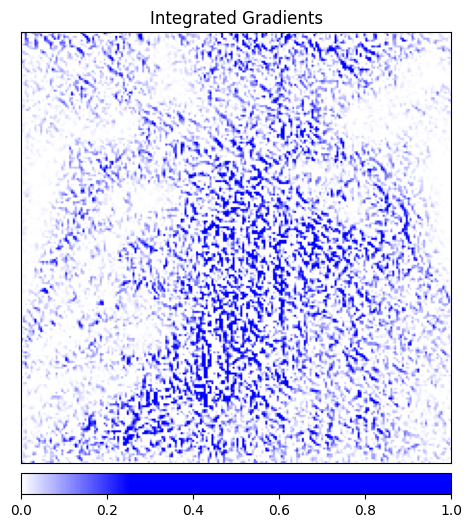

Predicted: Pneumonia ( 0.9999996423721313 ), Label: PNEUMONIA


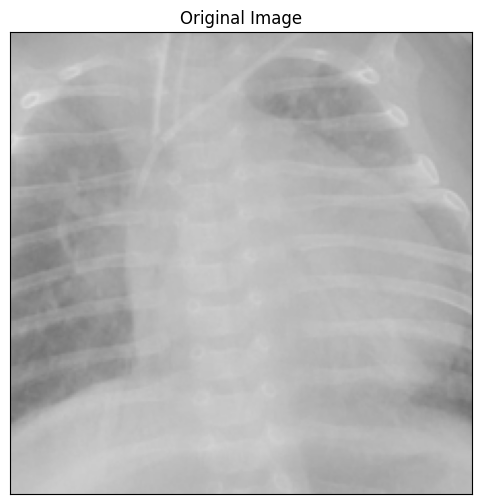

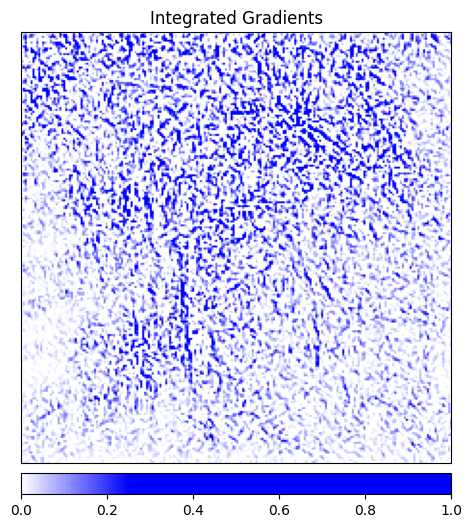

Predicted: Pneumonia ( 0.997241735458374 ), Label: PNEUMONIA


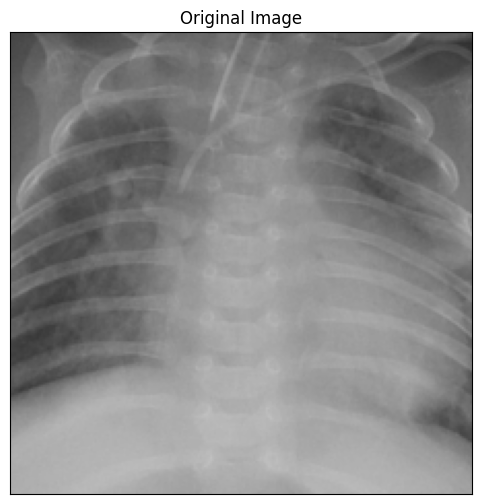

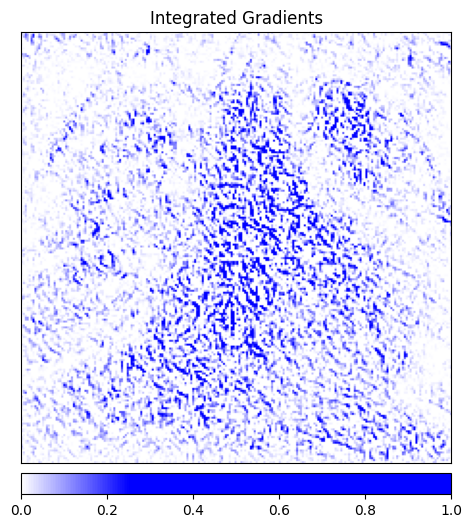

Predicted: Pneumonia ( 0.9998012185096741 ), Label: PNEUMONIA


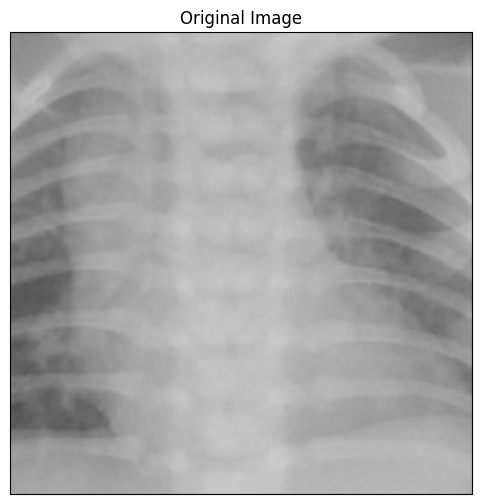

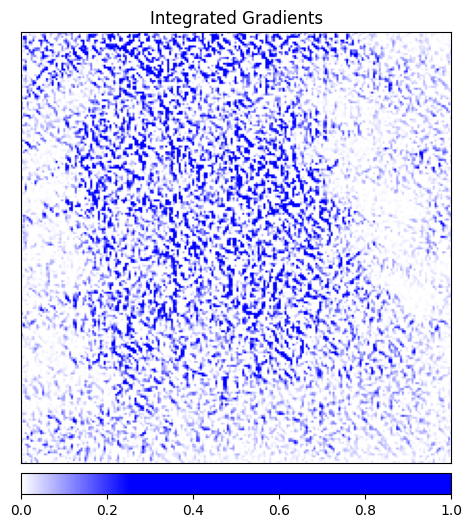

Predicted: Pneumonia ( 0.9967650175094604 ), Label: PNEUMONIA


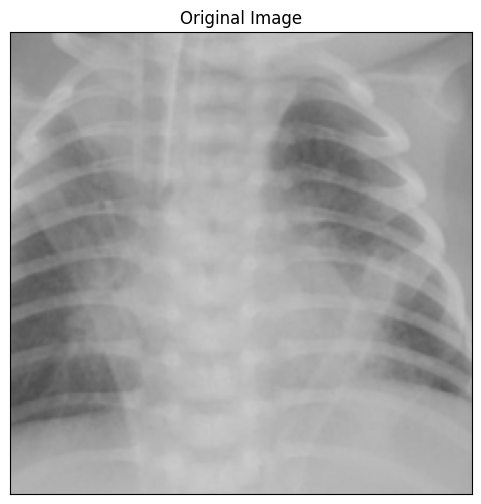

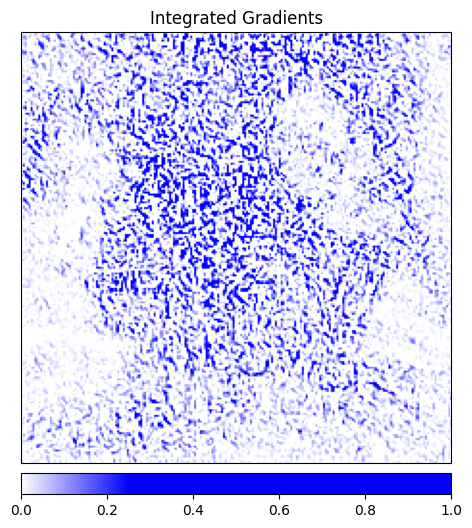

In [20]:
ig_cases = [
            'ml4h_data/p2/part2/archive/chest_xray/test/NORMAL/IM-0001-0001.jpeg',
            'ml4h_data/p2/part2/archive/chest_xray/test/NORMAL/IM-0003-0001.jpeg',
            'ml4h_data/p2/part2/archive/chest_xray/test/NORMAL/IM-0005-0001.jpeg',
            'ml4h_data/p2/part2/archive/chest_xray/test/NORMAL/IM-0006-0001.jpeg',
            'ml4h_data/p2/part2/archive/chest_xray/test/NORMAL/IM-0007-0001.jpeg',
    
            'ml4h_data/p2/part2/archive/chest_xray/test/PNEUMONIA/person1_virus_6.jpeg',
            'ml4h_data/p2/part2/archive/chest_xray/test/PNEUMONIA/person1_virus_7.jpeg',
            'ml4h_data/p2/part2/archive/chest_xray/test/PNEUMONIA/person1_virus_8.jpeg',
            'ml4h_data/p2/part2/archive/chest_xray/test/PNEUMONIA/person78_bacteria_378.jpeg',
            'ml4h_data/p2/part2/archive/chest_xray/test/PNEUMONIA/person78_bacteria_380.jpeg',
           ]
integrated_gradients = IntegratedGradients(model_ft)

for curr_path in ig_cases:
    test_img = Image.open(curr_path).convert('RGB')
    transformed_img = transform(test_img)
    input_img = transform_normalize(transformed_img)
    input_img = input_img.unsqueeze(0).to(device) # the model requires a dummy batch dimension


    output = model_ft(input_img)
    output = F.softmax(output, dim=1)
    prediction_score, pred_label_idx = torch.topk(output, 1)
    pred_label_idx.squeeze_()
    predicted_label = idx_to_labels[str(pred_label_idx.item())]
    print('Predicted:', predicted_label, '(', prediction_score.squeeze().item(), '), Label:', curr_path.split('/')[6])

    # Initialize the attribution algorithm with the model
    
    
    # Ask the algorithm to attribute our output target to
    attributions_ig = integrated_gradients.attribute(input_img, target=pred_label_idx, n_steps=200)
    
    # Show the original image for comparison
    _ = viz.visualize_image_attr(np.transpose(transformed_img.squeeze().cpu().detach().numpy(), (1,2,0)), np.transpose(transformed_img.squeeze().cpu().detach().numpy(), (1,2,0)),
                          method="original_image", title="Original Image")
    
    default_cmap = LinearSegmentedColormap.from_list('custom blue',
                                                     [(0, '#ffffff'),
                                                      (0.25, '#0000ff'),
                                                      (1, '#0000ff')], N=256)
    
    _ = viz.visualize_image_attr(np.transpose(attributions_ig.squeeze().cpu().detach().numpy(), (1,2,0)),
                                 np.transpose(transformed_img.squeeze().cpu().detach().numpy(), (1,2,0)),
                                 method='heat_map',
                                 cmap=default_cmap,
                                 show_colorbar=True,
                                 sign='positive',
                                 title='Integrated Gradients')

Label:  NORMAL
Predicted: Normal ( 0.9938475489616394 ), Label: NORMAL


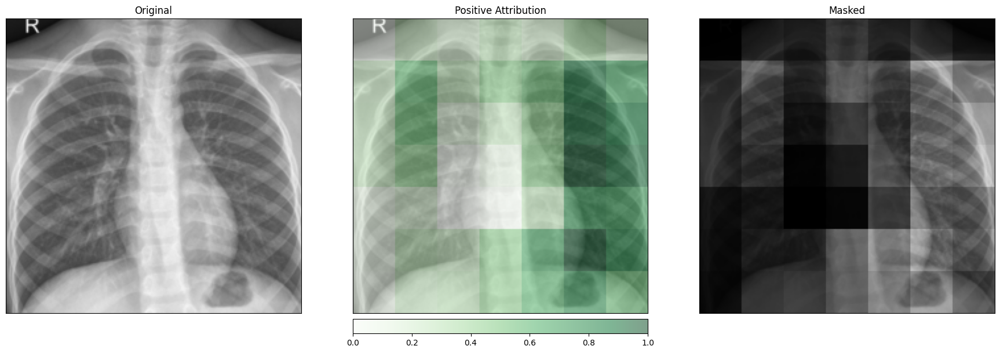

Label:  NORMAL
Predicted: Normal ( 0.9879900813102722 ), Label: NORMAL


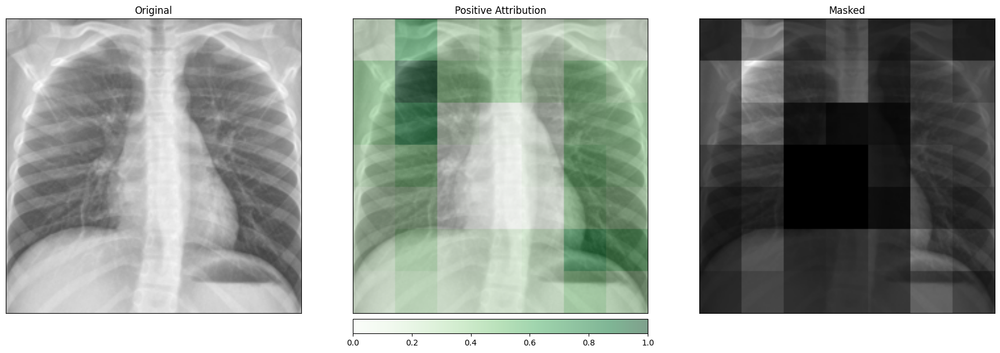

Label:  NORMAL
Predicted: Normal ( 0.9852103590965271 ), Label: NORMAL


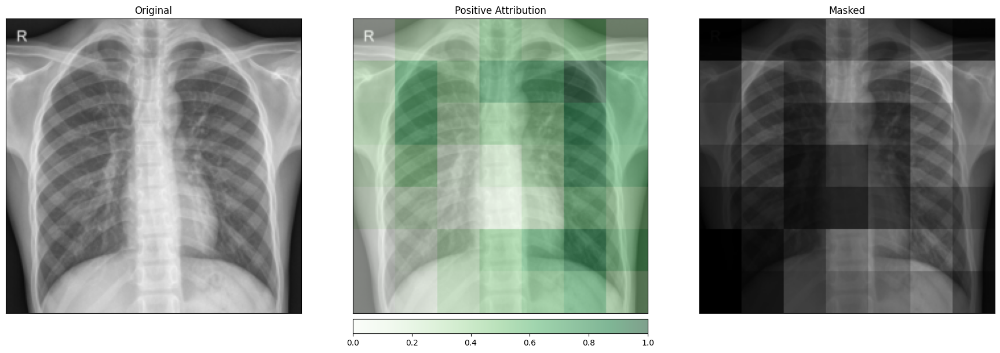

Label:  NORMAL
Predicted: Normal ( 0.7919201850891113 ), Label: NORMAL


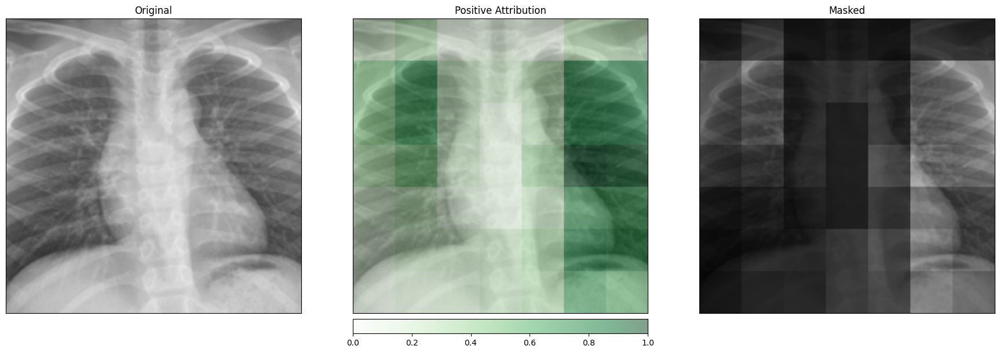

Label:  NORMAL
Predicted: Normal ( 0.9709368348121643 ), Label: NORMAL


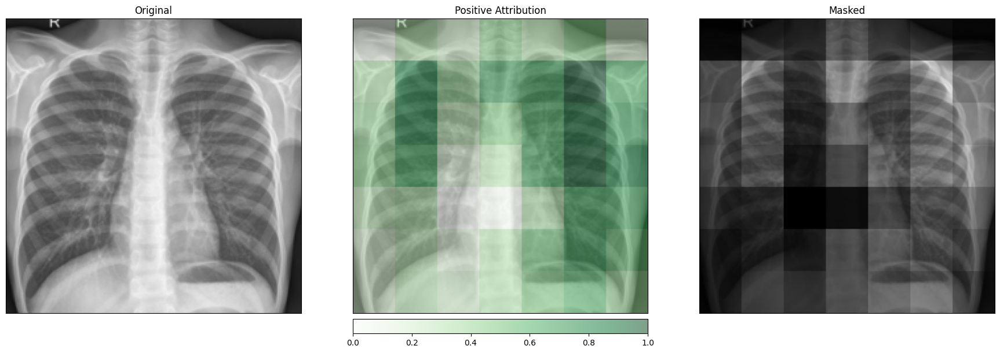

Label:  PNEUMONIA
Predicted: Pneumonia ( 0.9873391389846802 ), Label: PNEUMONIA


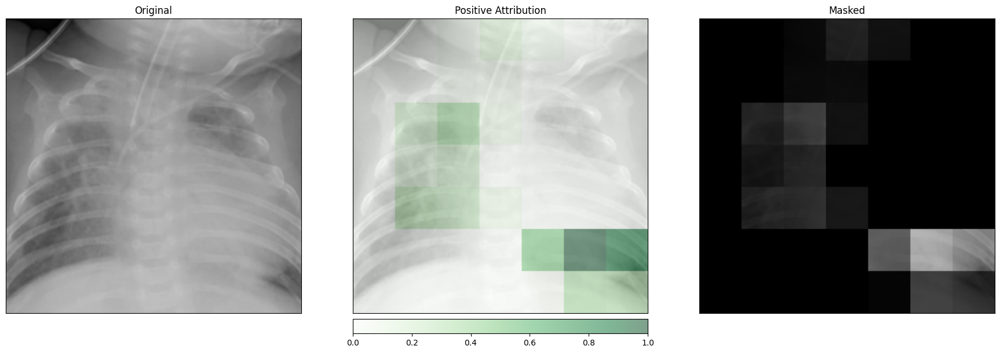

Label:  PNEUMONIA
Predicted: Pneumonia ( 0.9999996423721313 ), Label: PNEUMONIA


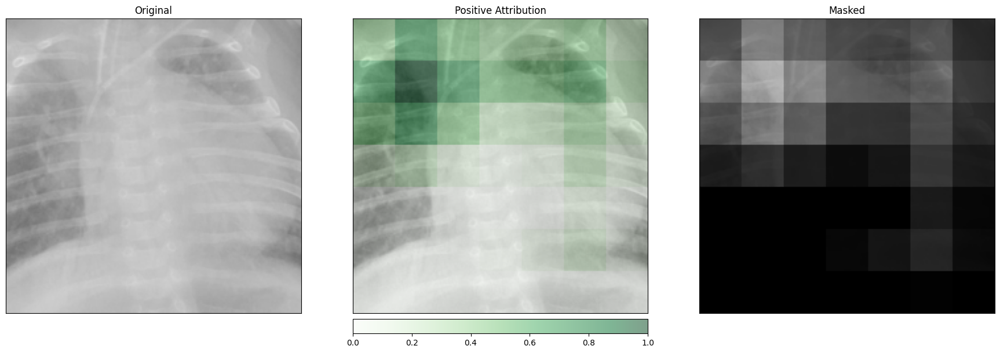

Label:  PNEUMONIA
Predicted: Pneumonia ( 0.997241735458374 ), Label: PNEUMONIA


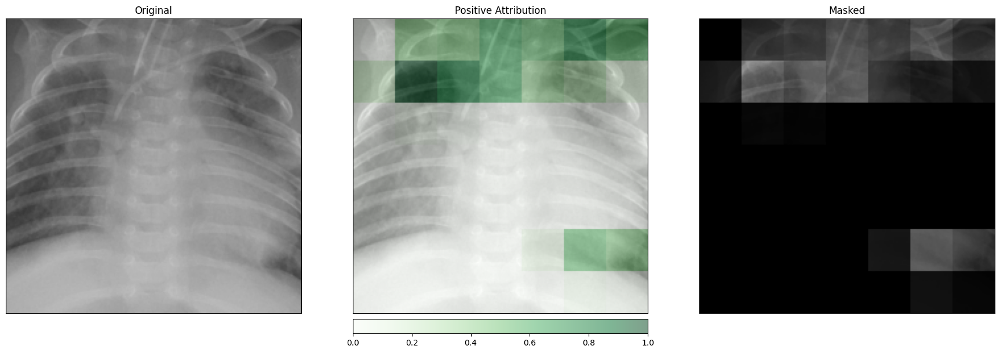

Label:  PNEUMONIA
Predicted: Pneumonia ( 0.9998012185096741 ), Label: PNEUMONIA


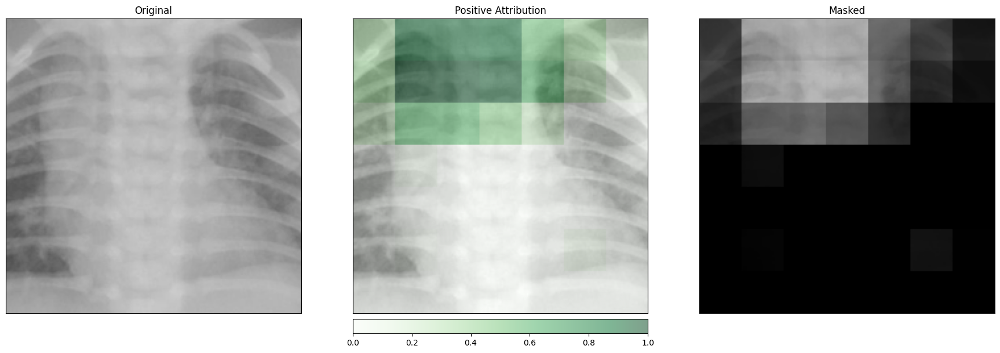

Label:  PNEUMONIA
Predicted: Pneumonia ( 0.9967650175094604 ), Label: PNEUMONIA


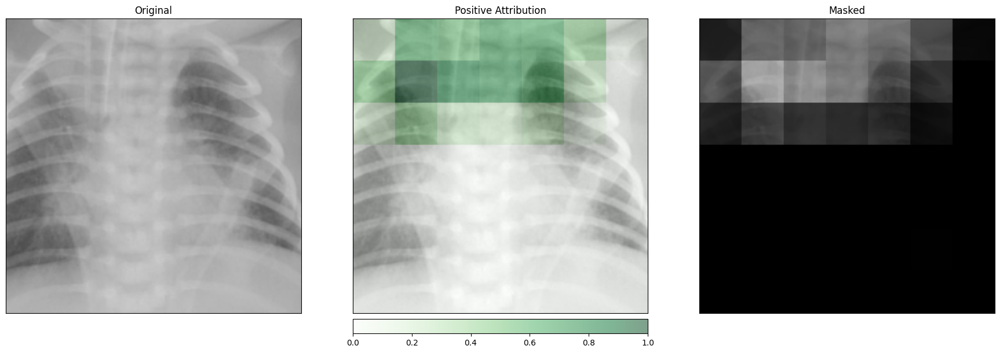

In [21]:
layer_gradcam = LayerGradCam(model_ft, model_ft.layer4[1].conv2)

for curr_path in ig_cases:
    print('Label: ', curr_path.split('/')[6])
    test_img = Image.open(curr_path).convert('RGB')
    transformed_img = transform(test_img)
    input_img = transform_normalize(transformed_img)
    input_img = input_img.unsqueeze(0).to(device)
    
    output = model_ft(input_img)
    output = F.softmax(output, dim=1)
    prediction_score, pred_label_idx = torch.topk(output, 1)
    pred_label_idx.squeeze_()
    predicted_label = idx_to_labels[str(pred_label_idx.item())]
    print('Predicted:', predicted_label, '(', prediction_score.squeeze().item(), '), Label:', curr_path.split('/')[6])
    
    attributions_lgc = layer_gradcam.attribute(input_img, target=pred_label_idx)
    
    upsamp_attr_lgc = LayerAttribution.interpolate(attributions_lgc, input_img.shape[2:])
    
    _ = viz.visualize_image_attr_multiple(upsamp_attr_lgc[0].cpu().permute(1,2,0).detach().numpy(),
                                          transformed_img.permute(1,2,0).numpy(),
                                          ["original_image","blended_heat_map","masked_image"],
                                          ["all","positive","positive"],
                                          show_colorbar=True,
                                          titles=["Original", "Positive Attribution", "Masked"],
                                          fig_size=(18, 6))